In [ ]:
import pandas as pd
from matplotlib import pyplot as plt
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn import metrics
from sklearn.preprocessing import LabelEncoder
import pickle
import seaborn as sns
import csv
from sklearn.model_selection import GridSearchCV

In [ ]:
from google.colab import drive
drive.mount('/content/Drive')

Mounted at /content/Drive


In [ ]:
reader = csv.reader(open("/content/Drive/MyDrive/Cardio vascular dataset/cardiovascular_diseases_dv3.csv", "r"), delimiter=';')
writer = csv.writer(open("/home/cardiovascular_diseases_dv3.csv", 'w'), delimiter=',')
writer.writerows(reader)

In [ ]:
df = pd.read_csv("/home/cardiovascular_diseases_dv3.csv")
df.head(10)

,AGE,GENDER,HEIGHT,WEIGHT,AP_HIGH,AP_LOW,CHOLESTEROL,GLUCOSE,SMOKE,ALCOHOL,PHYSICAL_ACTIVITY,CARDIO_DISEASE
0,50,2,168,62,110,80,1,1,0,0,1,0
1,55,1,156,85,140,90,3,1,0,0,1,1
2,52,1,165,64,130,70,3,1,0,0,0,1
3,48,2,169,82,150,100,1,1,0,0,1,1
4,48,1,156,56,100,60,1,1,0,0,0,0
5,60,1,151,67,120,80,2,2,0,0,0,0
6,61,1,157,93,130,80,3,1,0,0,1,0
7,62,2,178,95,130,90,3,3,0,0,1,1
8,48,1,158,71,110,70,1,1,0,0,1,0
9,54,1,164,68,110,60,1,1,0,0,0,0


In [ ]:
sizes = df['CARDIO_DISEASE'].value_counts(sort = 1)
print(sizes)

0    34633
1    33931
Name: CARDIO_DISEASE, dtype: int64


([<matplotlib.patches.Wedge at 0x7fe8398c7810>,
 [Text(-0.01769035015889908, 1.099857741488078, ''),
  Text(0.017690453135012867, -1.099857739831783, '')],
 [Text(-0.009649281904854042, 0.5999224044480425, '50.5%'),
  Text(0.00964933807364338, -0.5999224035446089, '49.5%')])

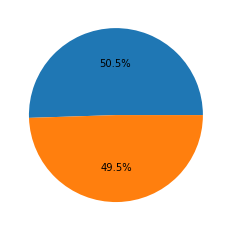

In [ ]:
plt.pie(sizes, autopct='%1.1f%%')

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 68564 entries, 0 to 68563
Data columns (total 12 columns):
 #   Column             Non-Null Count  Dtype
---  ------             --------------  -----
 0   AGE                68564 non-null  int64
 1   GENDER             68564 non-null  int64
 2   HEIGHT             68564 non-null  int64
 3   WEIGHT             68564 non-null  int64
 4   AP_HIGH            68564 non-null  int64
 5   AP_LOW             68564 non-null  int64
 6   CHOLESTEROL        68564 non-null  int64
 7   GLUCOSE            68564 non-null  int64
 8   SMOKE              68564 non-null  int64
 9   ALCOHOL            68564 non-null  int64
 10  PHYSICAL_ACTIVITY  68564 non-null  int64
 11  CARDIO_DISEASE     68564 non-null  int64
dtypes: int64(12)
memory usage: 6.3 MB


In [ ]:
!pip install AutoViz
!pip install xlrd

In [ ]:
#importation de la classe Autoviz
from autoviz.AutoViz_Class import AutoViz_Class

#Initialiser la classe Autoviz
AV = AutoViz_Class()

Imported AutoViz_Class version: 0.0.81. Call using:
    from autoviz.AutoViz_Class import AutoViz_Class
    AV = AutoViz_Class()
    AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=0,
                            lowess=False,chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30)
Note: verbose=0 or 1 generates charts and displays them in your local Jupyter notebook.
      verbose=2 saves plots in your local machine under AutoViz_Plots directory and does not display charts.


File encoding decoder utf-8 does not work for this file
File encoding decoder iso-8859-11 does not work for this file
File encoding decoder cpl252 does not work for this file
File encoding decoder latin1 does not work for this file
Shape of your Data Set: (68564, 12)
############## C L A S S I F Y I N G  V A R I A B L E S  ####################
Classifying variables in data set...
    Number of Numeric Columns =  0
    Number of Integer-Categorical Columns =  7
    Number of String-Categorical Columns =  0
    Number of Factor-Categorical Columns =  0
    Number of String-Boolean Columns =  0
    Number of Numeric-Boolean Columns =  4
    Number of Discrete String Columns =  0
    Number of NLP String Columns =  0
    Number of Date Time Columns =  0
    Number of ID Columns =  0
    Number of Columns to Delete =  0
    11 Predictors classified...
        This does not include the Target column(s)
        No variables removed since no ID or low-information variables found in data set
Si

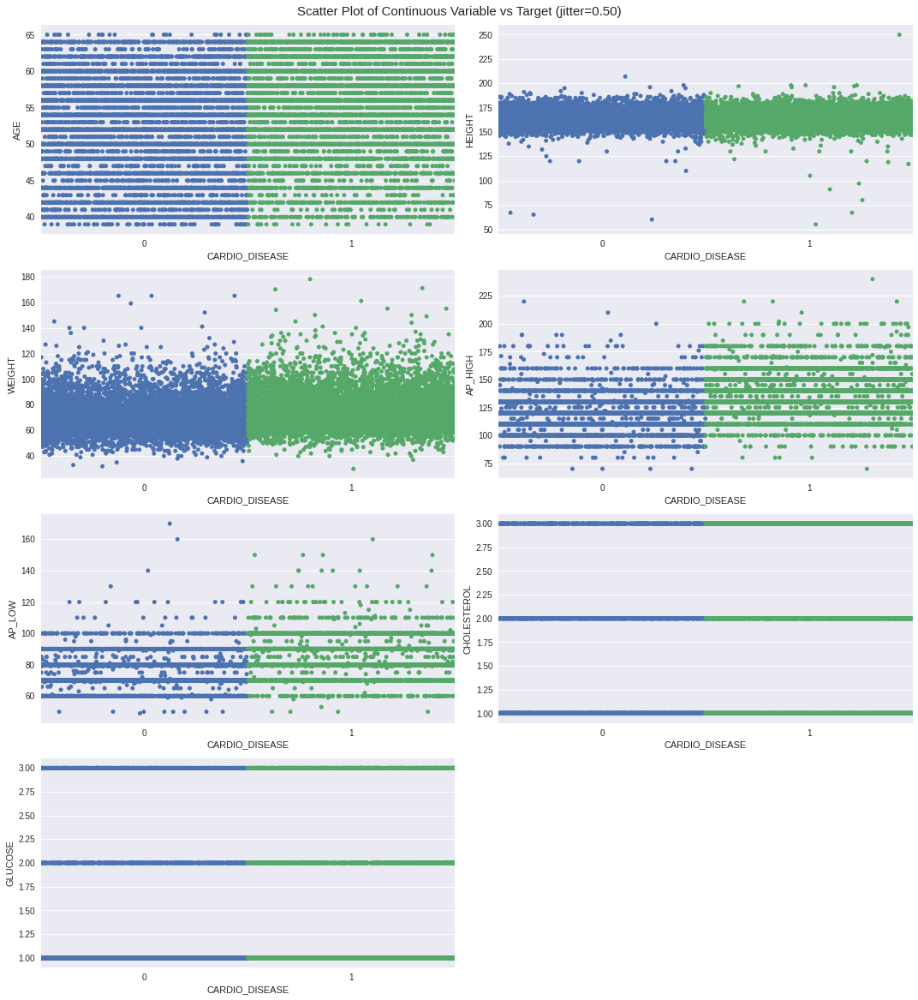

Total Number of Scatter Plots = 28


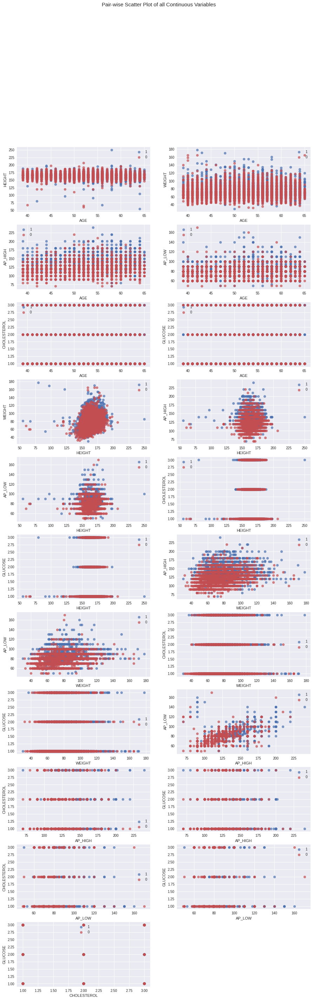

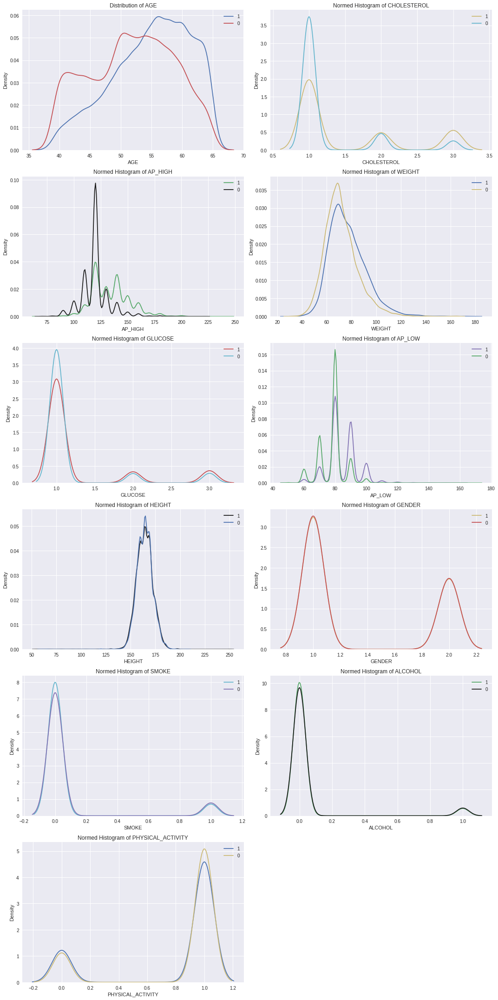

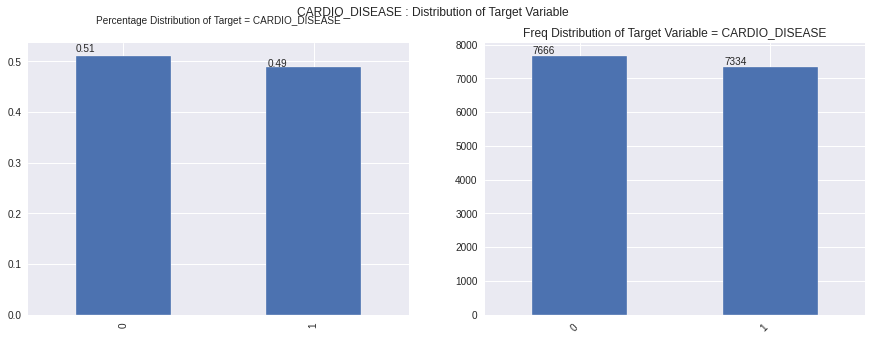

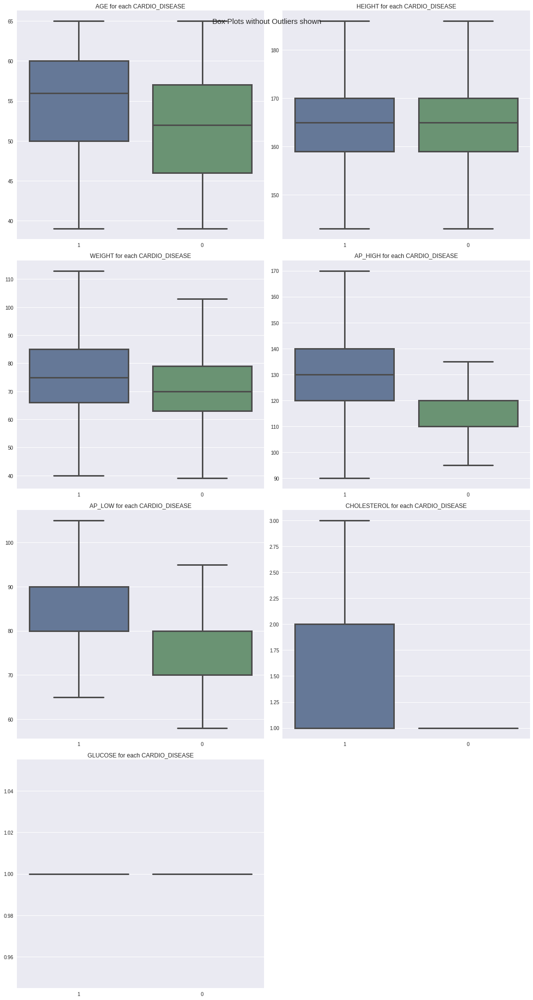

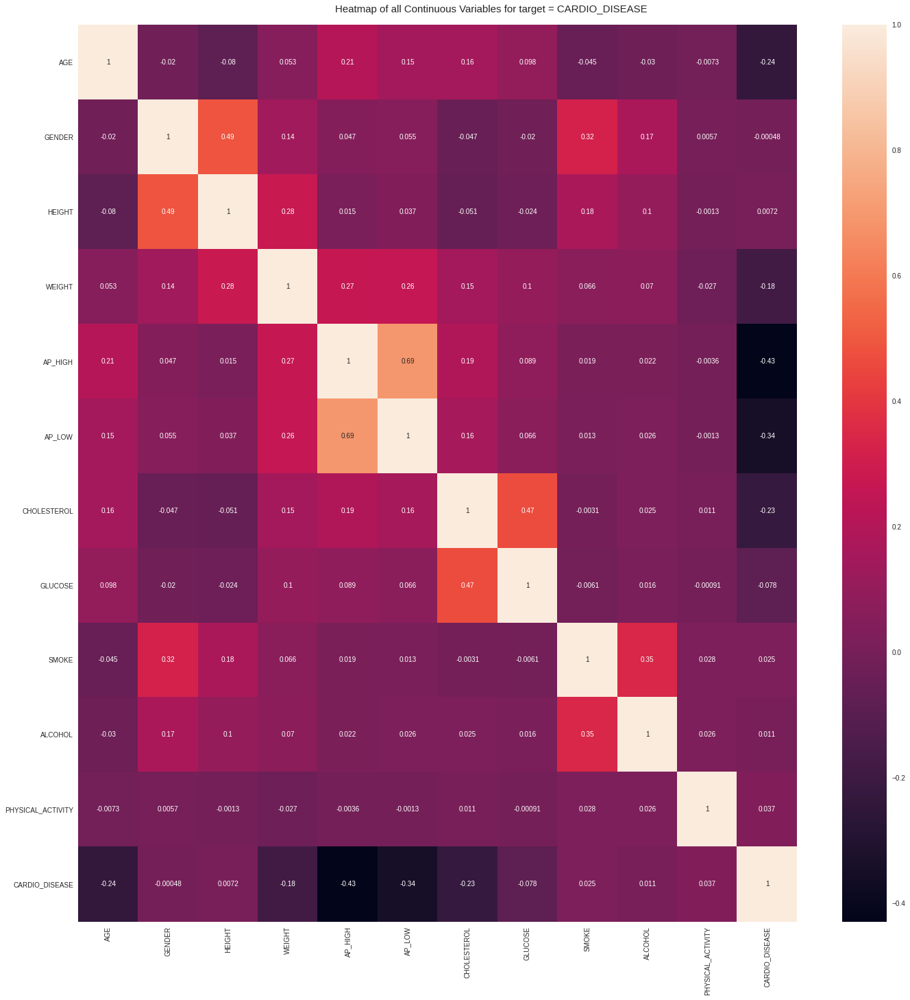

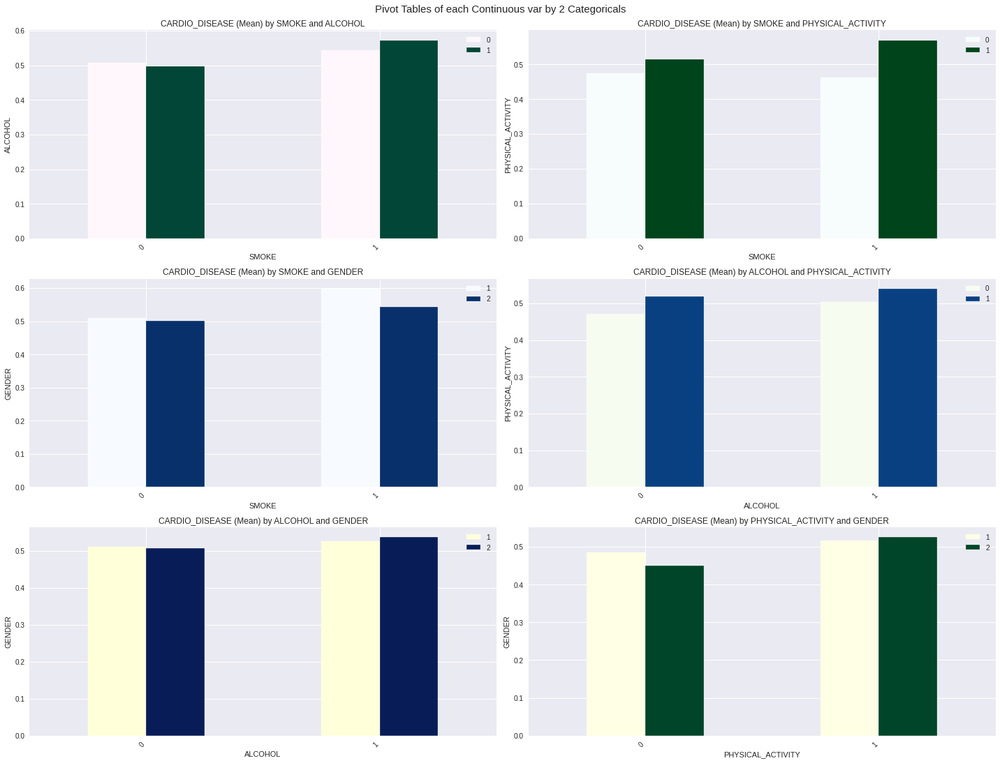

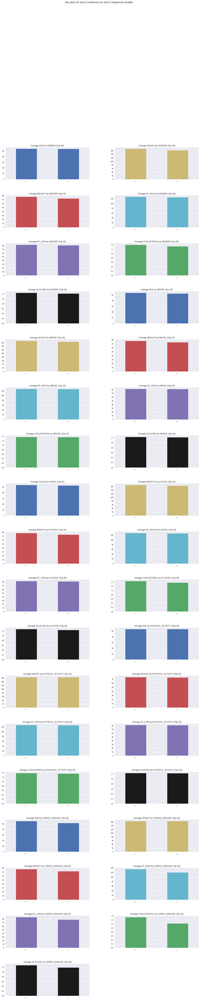

Time to run AutoViz (in seconds) = 29.785

 ###################### VISUALIZATION Completed ########################


In [ ]:
dftc = AV.AutoViz(filename='/home/cardiovascular_diseases_dv3.csv', 
                  sep ='' , 
                  depVar ='CARDIO_DISEASE', 
                  dfte =df, 
                  header = 0, 
                  verbose = 1, 
                  lowess = False, 
                  chart_format ='png', 
                  max_rows_analyzed = 15000, 
                  max_cols_analyzed = 30)

Shape of your Data Set: (68564, 12)
############## C L A S S I F Y I N G  V A R I A B L E S  ####################
Classifying variables in data set...
    Number of Numeric Columns =  0
    Number of Integer-Categorical Columns =  7
    Number of String-Categorical Columns =  0
    Number of Factor-Categorical Columns =  0
    Number of String-Boolean Columns =  0
    Number of Numeric-Boolean Columns =  5
    Number of Discrete String Columns =  0
    Number of NLP String Columns =  0
    Number of Date Time Columns =  0
    Number of ID Columns =  0
    Number of Columns to Delete =  0
    12 Predictors classified...
        This does not include the Target column(s)
        No variables removed since no ID or low-information variables found in data set
Number of All Scatter Plots = 28


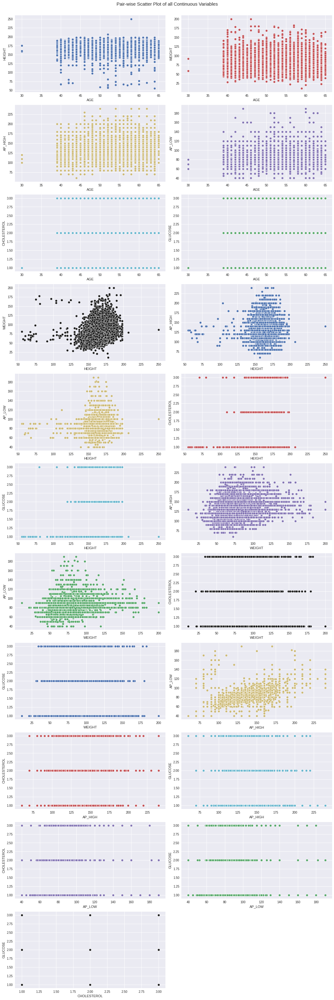

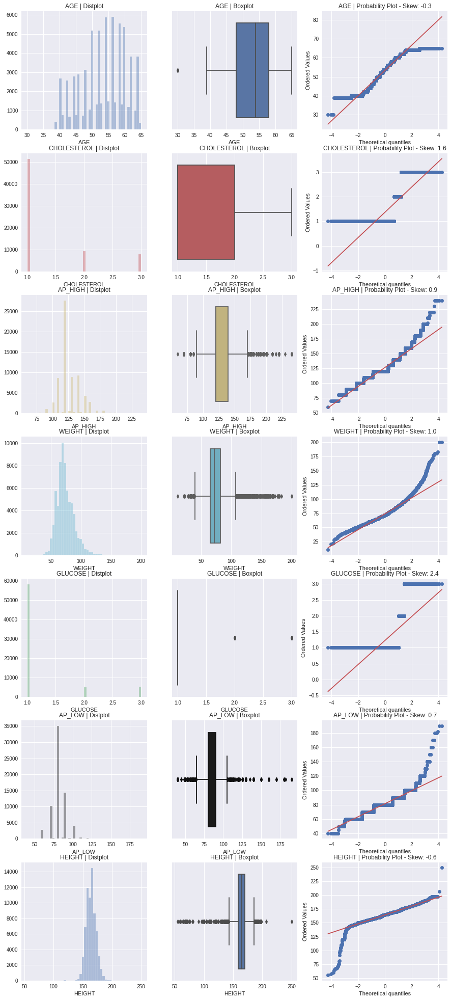

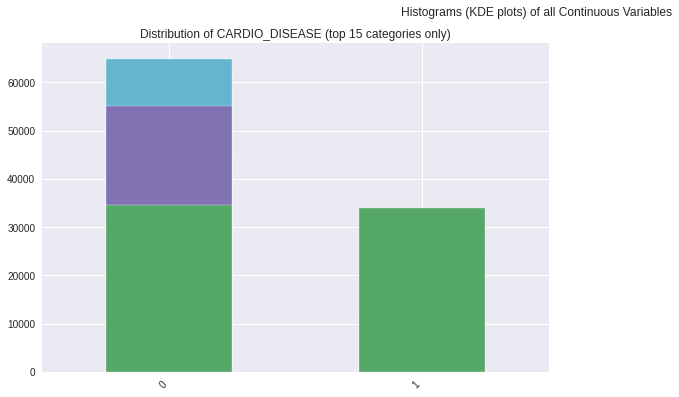

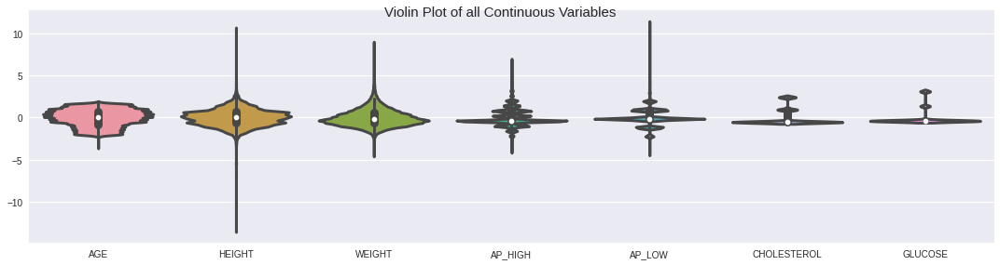

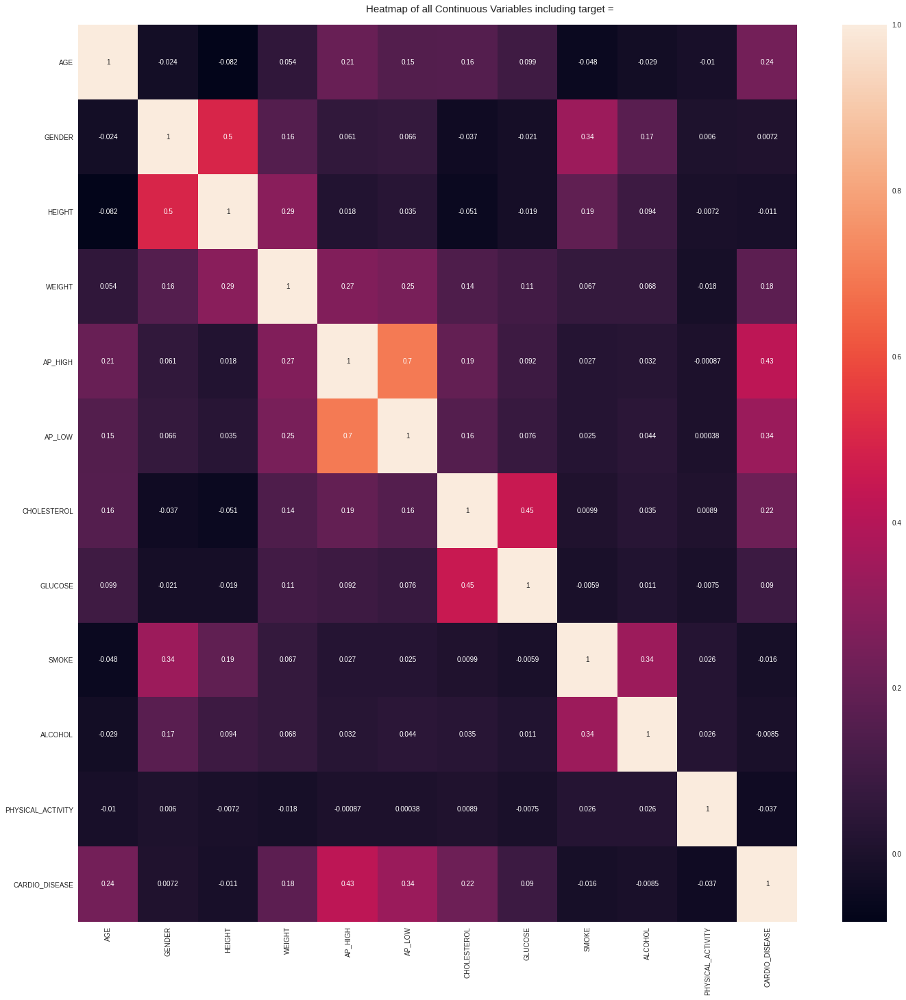

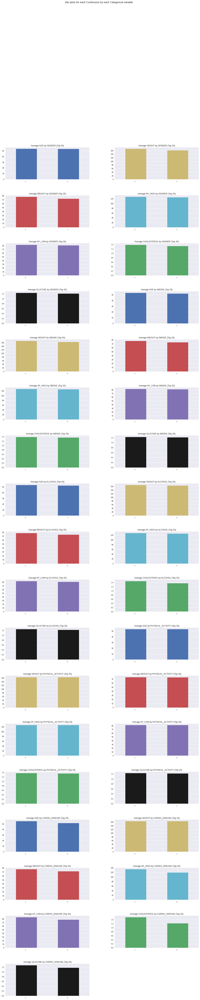

Time to run AutoViz (in seconds) = 28.016

 ###################### VISUALIZATION Completed ########################


In [ ]:
dftc = AV.AutoViz('/home/cardiovascular_diseases_dv3.csv')

In [ ]:
X = df.drop("CARDIO_DISEASE", axis = 1)
Y = df['CARDIO_DISEASE']

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, random_state=42,shuffle = True)


In [ ]:
model = RandomForestClassifier(n_estimators = 11, random_state = 13)


In [ ]:
model.fit(X_train, y_train)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=11,
                       n_jobs=None, oob_score=False, random_state=13, verbose=0,
                       warm_start=False)

In [ ]:
prediction_test = model.predict(X_test)

In [ ]:
print ("Accuracy = ", metrics.accuracy_score(y_test, prediction_test))

Accuracy =  0.6913148107635091


In [ ]:
  #Maintenant aprés avoir eu une Accuracy faible , nous allons l'augemnter en jouant sur quelques parametres 
  param_grid=[{'criterion': ['gini', 'entropy'],
                          'max_depth': [5, 6, 7, 8, 9, 10, 11, 12, 13, 14],
                          'n_estimators': [5, 6, 7, 8, 9, 10, 11, 12, 13, 14,15, 16, 17, 18, 19, 20]}]

In [ ]:
optimal_params = GridSearchCV(
    RandomForestClassifier(),
    param_grid,
    cv=5,
    scoring='accuracy',
    verbose=2
)

In [ ]:
optimal_params.fit(X_train,y_train)

Fitting 5 folds for each of 320 candidates, totalling 1600 fits
[CV] criterion=gini, max_depth=5, n_estimators=5 .....................
[CV] ...... criterion=gini, max_depth=5, n_estimators=5, total=   0.1s
[CV] criterion=gini, max_depth=5, n_estimators=5 .....................


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s


[CV] ...... criterion=gini, max_depth=5, n_estimators=5, total=   0.1s
[CV] criterion=gini, max_depth=5, n_estimators=5 .....................
[CV] ...... criterion=gini, max_depth=5, n_estimators=5, total=   0.1s
[CV] criterion=gini, max_depth=5, n_estimators=5 .....................
[CV] ...... criterion=gini, max_depth=5, n_estimators=5, total=   0.1s
[CV] criterion=gini, max_depth=5, n_estimators=5 .....................
[CV] ...... criterion=gini, max_depth=5, n_estimators=5, total=   0.1s
[CV] criterion=gini, max_depth=5, n_estimators=6 .....................
[CV] ...... criterion=gini, max_depth=5, n_estimators=6, total=   0.1s
[CV] criterion=gini, max_depth=5, n_estimators=6 .....................
[CV] ...... criterion=gini, max_depth=5, n_estimators=6, total=   0.1s
[CV] criterion=gini, max_depth=5, n_estimators=6 .....................
[CV] ...... criterion=gini, max_depth=5, n_estimators=6, total=   0.1s
[CV] criterion=gini, max_depth=5, n_estimators=6 .....................
[CV] .

[Parallel(n_jobs=1)]: Done 1600 out of 1600 | elapsed:  9.8min finished


GridSearchCV(cv=5, error_score=nan,
             estimator=RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                                              class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              max_samples=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators=100, n_jobs=None,
                                              oob_score=False,
                                              rando

In [ ]:
print(optimal_params.best_params_)

{'criterion': 'gini', 'max_depth': 10, 'n_estimators': 18}


In [ ]:
model2 = RandomForestClassifier(n_estimators = 18,max_depth=10,criterion='gini', random_state = 13)

In [ ]:
model2.fit(X_train, y_train)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=10, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=18,
                       n_jobs=None, oob_score=False, random_state=13, verbose=0,
                       warm_start=False)

In [ ]:
prediction_test2 = model2.predict(X_test)

In [ ]:
print ("Accuracy = ", metrics.accuracy_score(y_test, prediction_test2))

Accuracy =  0.7339750601618902


In [ ]:
#Nous remarquerons que aprés avoir joué sur differents parametres , l'Accuracy a augmenté 

In [ ]:
#sauvegarder le modéle avec la bonne Accuracy
filename = '/content/Drive/MyDrive/Cardio vascular models/model random forest with cross validation acc_73_397.sav'
pickle.dump(model2, open(filename, 'wb'))

In [ ]:
#Matrice de confusion 
cm = metrics.confusion_matrix(y_test,prediction_test2)
print(cm)

[[5576 1449]
 [2199 4489]]


In [ ]:
feature_list = list(X.columns)
feature_imp = pd.Series(model2.feature_importances_,index=feature_list).sort_values(ascending=False)
print(feature_imp)

AP_HIGH              0.389198
AP_LOW               0.270772
AGE                  0.119513
CHOLESTEROL          0.096915
WEIGHT               0.053460
HEIGHT               0.030835
GLUCOSE              0.014450
PHYSICAL_ACTIVITY    0.008555
SMOKE                0.006159
GENDER               0.005681
ALCOHOL              0.004463
dtype: float64


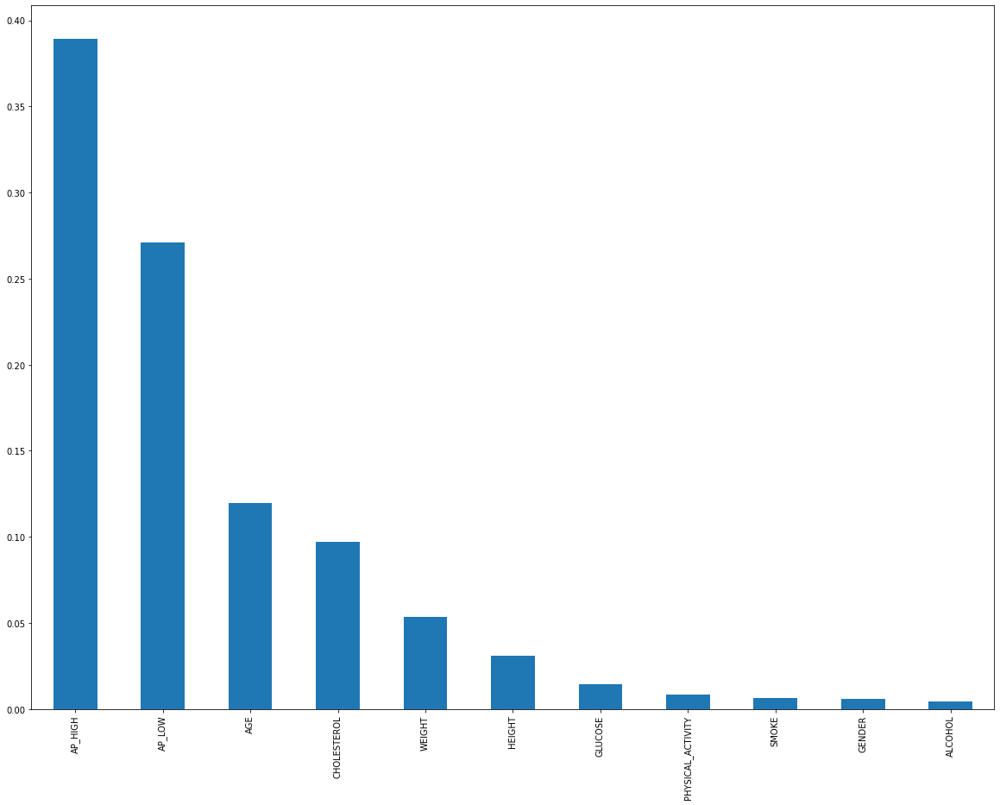

In [ ]:
feature_imp.plot(kind='bar',figsize=(20,15))

In [ ]:
# installer le paquet pydotplus dans le noyau 
!pip install pydotplus

In [ ]:
from sklearn.externals.six import StringIO  
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus as pydot

dot_data = StringIO()
#affichage d'un seul arbre à partir du classificateur de forêt aléatoire
export_graphviz(model2.estimators_[1], out_file=dot_data,  
                filled=True, rounded=True,
                feature_names=X.columns,
                class_names=True,
                rotate=True)

graph = pydot.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_svg())

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.633252 to fit

